Removing Area Code, Phone Number, State, Account Length

In [1]:
import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension
!pip install matplotlib
!pip install graphviz

     |████████████████████████████████| 266kB 7.0MB/s 
     |████████████████████████████████| 71kB 4.5MB/s 
     |████████████████████████████████| 3.1MB 35.6MB/s 
     |████████████████████████████████| 71kB 6.8MB/s 
     |████████████████████████████████| 604kB 46.0MB/s 
     |████████████████████████████████| 112kB 48.5MB/s 
     |████████████████████████████████| 296kB 39.7MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=0ba124b15127fb3da563625875189f0d2a690daa94f17d7b4e2234c1f2e33fcd
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built htmlmin
  Found existing installation: tqdm 4.41.1
    Uninstalling tqdm-4.41.1:
      Successfully uninstalled tqdm-4.41.1
  Found existing installation: jupyter-client 5.3.5
    Uninstalling jupyter-client-5.3.5:
      Successfully uninstalled jupyter-client-5.3.5
  Found existing installation: pandas-profiling 1.4.1
    Uninstal

Upload your data set file to Google Drive. We are using churn.arff

In [2]:
from google.colab import files
uploaded = files.upload()

Saving churn.arff to churn.arff


In [4]:
import pandas as pd
from scipy.io import arff
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import svm
from sklearn import ensemble
from sklearn import neighbors
from sklearn import linear_model
from sklearn import metrics
from sklearn import preprocessing
%matplotlib inline 
from IPython.display import Image
import matplotlib as mlp
import matplotlib.pyplot as plt
import os
import seaborn as sns
import graphviz

data=arff.loadarff('churn.arff')

df=pd.DataFrame(data[0])
for col in df.columns:
  if df[col].dtype=='object':
    #convert data to utf-8 standard
    df[col] = df[col].str.decode('utf-8')

del df['State']
del df['Account Length']
del df['Area Code']
del df['Phone Number']
print(df.dtypes)


Inter Plan                       object
VoiceMail Plan                   object
No of Vmail Mesgs               float64
Total Day Min                   float64
Total Day calls                 float64
Total Day Charge                float64
Total Evening Min               float64
Total Evening Calls             float64
Total Evening Charge            float64
Total Night Minutes             float64
Total Night Calls               float64
Total Night Charge              float64
Total Int Min                   float64
Total Int Calls                 float64
Total Int Charge                float64
No of Calls Customer Service    float64
Churn                            object
dtype: object


In [5]:
# Let's display first 10 records 
df.head(10)


,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Churn
0,no,yes,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,FALSE
1,no,no,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,FALSE
2,yes,no,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,FALSE
3,yes,no,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,FALSE
4,yes,no,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,FALSE
5,no,yes,24.0,218.2,88.0,37.09,348.5,108.0,29.62,212.6,118.0,9.57,7.5,7.0,2.03,3.0,FALSE
6,yes,no,0.0,157.0,79.0,26.69,103.1,94.0,8.76,211.8,96.0,9.53,7.1,6.0,1.92,0.0,FALSE
7,no,no,0.0,184.5,97.0,31.37,351.6,80.0,29.89,215.8,90.0,9.71,8.7,4.0,2.35,1.0,FALSE
8,yes,yes,37.0,258.6,84.0,43.96,222.0,111.0,18.87,326.4,97.0,14.69,11.2,5.0,3.02,0.0,FALSE
9,no,no,0.0,129.1,137.0,21.95,228.5,83.0,19.42,208.8,111.0,9.40,12.7,6.0,3.43,4.0,TRUE


In [6]:
class_name = 'Churn'
first_col = df.pop(class_name)
df.insert(0, class_name, first_col)
df.head(10)

,Churn,Inter Plan,VoiceMail Plan,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
0,FALSE,no,yes,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0
1,FALSE,no,no,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0
2,FALSE,yes,no,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0
3,FALSE,yes,no,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0
4,FALSE,yes,no,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0
5,FALSE,no,yes,24.0,218.2,88.0,37.09,348.5,108.0,29.62,212.6,118.0,9.57,7.5,7.0,2.03,3.0
6,FALSE,yes,no,0.0,157.0,79.0,26.69,103.1,94.0,8.76,211.8,96.0,9.53,7.1,6.0,1.92,0.0
7,FALSE,no,no,0.0,184.5,97.0,31.37,351.6,80.0,29.89,215.8,90.0,9.71,8.7,4.0,2.35,1.0
8,FALSE,yes,yes,37.0,258.6,84.0,43.96,222.0,111.0,18.87,326.4,97.0,14.69,11.2,5.0,3.02,0.0
9,TRUE,no,no,0.0,129.1,137.0,21.95,228.5,83.0,19.42,208.8,111.0,9.40,12.7,6.0,3.43,4.0


In [7]:
# look at meta information about data, such as null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 17 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Churn                         3333 non-null   object 
 1   Inter Plan                    3333 non-null   object 
 2   VoiceMail Plan                3333 non-null   object 
 3   No of Vmail Mesgs             3333 non-null   float64
 4   Total Day Min                 3333 non-null   float64
 5   Total Day calls               3333 non-null   float64
 6   Total Day Charge              3333 non-null   float64
 7   Total Evening Min             3333 non-null   float64
 8   Total Evening Calls           3333 non-null   float64
 9   Total Evening Charge          3333 non-null   float64
 10  Total Night Minutes           3333 non-null   float64
 11  Total Night Calls             3333 non-null   float64
 12  Total Night Charge            3333 non-null   float64
 13  Tot

In [8]:
# Let's see meta information about numeric data, we can also see if there any extreme values
df.describe()

,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


It doesn't appear that there is any outstanding outliers. So no need to change the interquartile range

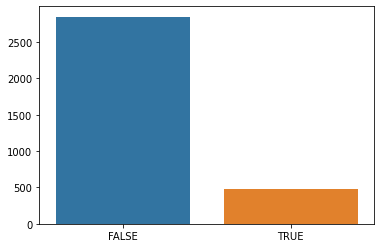

In [9]:
y = df['Churn'].value_counts()
#print (y)
sns.barplot(x = y.index, y = y.values)



In [10]:
y = df['Churn'].value_counts()
# Check the churn percentage
print(f'Churn Percentage = {((y[1]/y[0]) * 100 )}')


Churn Percentage = 16.94736842105263


The class is imbalanced. This will have an effect on FN rate.

# *This section uses One-hot encoding. Changes categorical variables.* 

Categorical to One-Hot (numeric) Encoding 

Now, let's try to create on-hot-encoding of categorical variables--i.e., each value in a categorical variable will become a variable itself and its value will be 1 or 0. This way we can encode categorical data into numerical features. More here: https://stackabuse.com/one-hot-encoding-in-python-with-pandas-and-scikit-learn/

In [16]:
#Let's create a list for our categorical columns for Churn dataset
cat_cols=['Inter Plan', 'VoiceMail Plan']

In [17]:
# Create a copy of the data frame in memory with a different name
df_onehot=df.copy()
#convert only categorical variables/features to dummy/one-hot features
df_onehot = pd.get_dummies(df, columns=cat_cols, prefix = cat_cols)
#print the dataset
df_onehot


,Churn,No of Vmail Mesgs,Total Day Min,Total Day calls,Total Day Charge,Total Evening Min,Total Evening Calls,Total Evening Charge,Total Night Minutes,Total Night Calls,Total Night Charge,Total Int Min,Total Int Calls,Total Int Charge,No of Calls Customer Service,Inter Plan_no,Inter Plan_yes,VoiceMail Plan_no,VoiceMail Plan_yes
0,FALSE,26.0,161.6,123.0,27.47,195.5,103.0,16.62,254.4,103.0,11.45,13.7,3.0,3.70,1.0,1,0,0,1
1,FALSE,0.0,243.4,114.0,41.38,121.2,110.0,10.30,162.6,104.0,7.32,12.2,5.0,3.29,0.0,1,0,1,0
2,FALSE,0.0,299.4,71.0,50.90,61.9,88.0,5.26,196.9,89.0,8.86,6.6,7.0,1.78,2.0,0,1,1,0
3,FALSE,0.0,166.7,113.0,28.34,148.3,122.0,12.61,186.9,121.0,8.41,10.1,3.0,2.73,3.0,0,1,1,0
4,FALSE,0.0,223.4,98.0,37.98,220.6,101.0,18.75,203.9,118.0,9.18,6.3,6.0,1.70,0.0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,FALSE,0.0,231.1,57.0,39.29,153.4,55.0,13.04,191.3,123.0,8.61,9.6,4.0,2.59,3.0,1,0,1,0
3329,FALSE,0.0,180.8,109.0,30.74,288.8,58.0,24.55,191.9,91.0,8.64,14.1,6.0,3.81,2.0,1,0,1,0
3330,FALSE,0.0,213.8,105.0,36.35,159.6,84.0,13.57,139.2,137.0,6.26,5.0,10.0,1.35,2.0,0,1,1,0
3331,FALSE,25.0,234.4,113.0,39.85,265.9,82.0,22.60,241.4,77.0,10.86,13.7,4.0,3.70,0.0,1,0,0,1


In [18]:
#train test set split
from sklearn.model_selection import train_test_split
class_col_name= 'Churn'
one_hot_feature_names=df_onehot.columns[df_onehot.columns != class_col_name]
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(df_onehot.loc[:, one_hot_feature_names], df_onehot[class_col_name], test_size=0.3,random_state=109) # 70% training and 30% test

In [33]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=109, ratio = 1.0)
X_train_res, y_train_res = sm.fit_sample(X_train, y_train)


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Train for Naive Bayes

In [34]:
# Repeat Naive Bayes modeling
from sklearn.naive_bayes import MultinomialNB

#Create a MultiNomial NB Classifier
nb = MultinomialNB()

#Train the model using the training sets
nb.fit(X_train_res, y_train_res)

#Predict the response for test dataset
y_pred = nb.predict(X_test)
print ("Succesfully done..")

Succesfully done..


Let's look at Naive Bayes output

In [35]:
print("Number of features used ",nb.n_features_)
print("Classes ",nb.classes_)
print("Number of records for classes ",nb.class_count_)
print("Log prior probability for classes ", nb.class_log_prior_)
print("Log conditional probability for each feature given a class\n",nb.feature_log_prob_)

Number of features used  18
Classes  ['FALSE' 'TRUE']
Number of records for classes  [2000. 2000.]
Log prior probability for classes  [-0.69314718 -0.69314718]
Log conditional probability for each feature given a class
 [[-4.70751335 -1.69913416 -2.26123244 -3.47105732 -1.57271486 -2.26455681
  -4.03777792 -1.56746441 -2.26289324 -4.66849907 -4.54430592 -5.3583462
  -5.85331016 -6.48250609 -6.93556188 -9.56237525 -7.21985744 -8.07573291]
 [-5.40678918 -1.5921437  -2.30415947 -3.36407303 -1.56164073 -2.32010173
  -4.02672172 -1.59294262 -2.32439242 -4.6939779  -4.5723227  -5.50960279
  -5.8813732  -6.10245807 -7.26346704 -8.16367862 -7.08615479 -8.81237548]]


We have probailities of a lot more features now.

See evaluation metrics below.

In [36]:
from sklearn.metrics import confusion_matrix
cf=confusion_matrix(y_test, y_pred)
print ("Confusion Matrix")
print(cf)
tn, fp, fn, tp=cf.ravel()
print ("TP: ", tp,", FP: ", fp,", TN: ", tn,", FN:", fn)

Confusion Matrix
[[467 383]
 [ 51  99]]
TP:  99 , FP:  383 , TN:  467 , FN: 51


In [37]:
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))



              precision    recall  f1-score   support

       FALSE       0.90      0.55      0.68       850
        TRUE       0.21      0.66      0.31       150

    accuracy                           0.57      1000
   macro avg       0.55      0.60      0.50      1000
weighted avg       0.80      0.57      0.63      1000



A low precision and recall on the True (Churned). Possibly the amount of numerical attributes is having an effect.

**Let's run decision tree on one-hot encoded data**

class Names ['FALSE' 'TRUE']


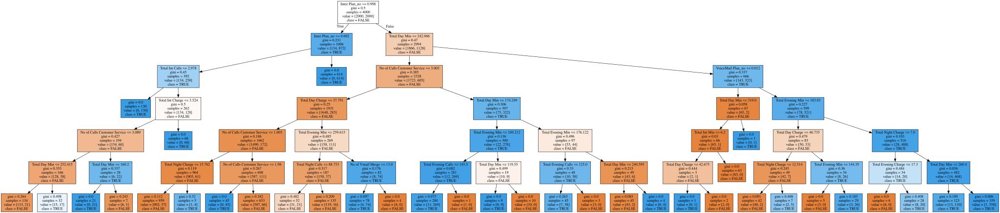

In [38]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=6)
clf = clf.fit(X_train_res, y_train_res)
import graphviz
#Get unique class values to display on the tree
class_values=df_onehot[class_col_name].unique()
print ("class Names",class_values)

dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=one_hot_feature_names,  
                                class_names=class_values,
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph


In [39]:
# Perform prediction on the test set
y_pred = clf.predict(X_test)

In [42]:

cf=confusion_matrix(y_test, y_pred)
print ("Confusion Matrix")
print(cf)
tn, fp, fn, tp=cf.ravel()
print ("TP: ", tp,", FP: ", fp,", TN: ", tn,", FN:", fn)

Confusion Matrix
[[825  25]
 [ 26 124]]
TP:  124 , FP:  25 , TN:  825 , FN: 26


In [41]:
# Get classification report
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

       FALSE       0.97      0.97      0.97       850
        TRUE       0.83      0.83      0.83       150

    accuracy                           0.95      1000
   macro avg       0.90      0.90      0.90      1000
weighted avg       0.95      0.95      0.95      1000



Reasonable FN rate but it is still effected by class imbalance

Let's try Random Forest

In [43]:

# Import RandomForestClassifier 
from sklearn.ensemble import RandomForestClassifier 
  
# Instantiate the classifier 
clf = RandomForestClassifier() 
  
# Fit to the training data 
clf.fit(X_train, y_train) 


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [44]:
# Perform prediction on the test set
y_pred = clf.predict(X_test)

In [45]:
cf=confusion_matrix(y_test, y_pred)
print ("Confusion Matrix")
print(cf)
tn, fp, fn, tp=cf.ravel()
print ("TP: ", tp,", FP: ", fp,", TN: ", tn,", FN:", fn)

Confusion Matrix
[[848   2]
 [ 38 112]]
TP:  112 , FP:  2 , TN:  848 , FN: 38


In [46]:
# Get classification report
from sklearn.metrics import classification_report
from sklearn import metrics

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

       FALSE       0.96      1.00      0.98       850
        TRUE       0.98      0.75      0.85       150

    accuracy                           0.96      1000
   macro avg       0.97      0.87      0.91      1000
weighted avg       0.96      0.96      0.96      1000



Random Forest performed poorly here. The class imbalance causes a large amount of FN

**Appendix**

**Exploratory Analysis**

We have learnt how to implement classification algorithms in Python but we have just done basic exploratory data analysis in the beginning using info function, describe function,and  head function of Pandas. Here is a very good Python pacakge that performs varirty of the basic analysis by itself and generates a report for you. You can analyze mising values, dupicate values, correlation, etc.


In [47]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df)

In [48]:
profile.to_widgets()

/usr/local/lib/python3.6/dist-packages/pandas_profiling/profile_report.py:397: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  "Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60)."


Using SMOTE and removing a few attributes helped in improving the accuracy. We can try removing a few more attributes to see if there is any more improvement.